# Load Data and check recording


In [2]:
import spikeinterface.full as si
import matplotlib.pyplot as plt
import numpy as np
import probeinterface as pi
from pathlib import Path
import pandas as pd 
import os, sys
import shutil
from pprint import pprint 
import time as time
import json
%load_ext autoreload
%autoreload 2

import bombcell as bc

    
global_job_kwargs = dict(n_jobs=-3, chunk_duration="10s",progress_bar=True)
si.set_global_job_kwargs(**global_job_kwargs)


basefolder= r"H:\Data\raw\8251_recall_g0"
base_path = Path(basefolder)
metapath = base_path / 'Meta'
if not os.path.isdir(metapath):
   os.makedirs(metapath)



recording =  si.read_spikeglx(basefolder, stream_id='imec0.ap', load_sync_channel=False)
lfp = si.read_spikeglx(basefolder, stream_id='imec0.lf', load_sync_channel=False)
event =  si.read_spikeglx(basefolder, stream_id='nidq', load_sync_channel=False)
print(recording)





The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
SpikeGLXRecordingExtractor: 384 channels - 29999.900000 Hz - 1 segments - 146,941,580 samples 
                            4,898.07s (1.36 hours) - int16 dtype - 105.10 GiB


# Preprocessing

In [ ]:
#recording = si.ChannelSliceRecording(recording, channel_ids=recording.get_channel_ids()[180:330])
#rec1 = si.highpass_filter(recording, freq_min=400.)
rec1 = si.bandpass_filter(recording)
rec1 = si.phase_shift(rec1)
bad_channel_ids, channel_labels = si.detect_bad_channels(rec1,method = 'coherence+psd')
print(bad_channel_ids)
rec1 = si.interpolate_bad_channels(recording=rec1, bad_channel_ids=bad_channel_ids)

rec1 = si.common_reference(rec1, operator="median", reference="global")
print(rec1)


%matplotlib widget
si.plot_traces({'raw':recording,'filtered':rec1}, backend='ipywidgets')

from spikeinterface.sorters import installed_sorters
installed_sorters()
import torch
print(torch.cuda.is_available())
print(torch.cuda.current_device())
torch.cuda.get_device_name(0)

# Optional time slice

In [3]:
sampling_frequency = recording.sampling_frequency
rec1 = recording_slice_frames = recording.frame_slice(start_frame=0,
                                               end_frame=int(4739*sampling_frequency))

rec1

FrameSliceRecording: 384 channels - 29999.900000 Hz - 1 segments - 142,169,526 samples 
                     4,739.00s (1.32 hours) - int16 dtype - 101.69 GiB

# Run Kilosort and postprocessing pipeline

In [4]:

Sorting_KS4 = si.run_sorter(sorter_name="kilosort4", recording=rec1, folder=basefolder + str('/sorted'),remove_existing_folder=True)
analyzer = si.create_sorting_analyzer(Sorting_KS4, rec1, sparse=True, format='binary_folder',folder=basefolder +str('/analyzer'))

analyzer.compute(['random_spikes', 'waveforms', 'templates', 'noise_levels','unit_locations','correlograms'],**global_job_kwargs)
analyzer.compute('spike_amplitudes')
analyzer.compute('principal_components', n_components = 5, mode="by_channel_local",**global_job_kwargs)
analyzer.compute(["spike_locations", "template_metrics", "quality_metrics"]**global_job_kwargs)

metric_names=['firing_rate', 'presence_ratio', 'snr','isi_violation', 'amplitude_cutoff','amplitude_median']
metrics = si.compute_quality_metrics(analyzer, metric_names=metric_names)



print(analyzer)


#si.export_to_phy(analyzer, output_folder= base_path /'sorted'/ 'phy',**global_job_kwargs)





100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [03:28<00:00, 208.90s/it]


estimate_sparsity (workers: 38 processes):   0%|          | 0/474 [00:00<?, ?it/s]

C:\Users\Freitag\si_env\Lib\site-packages\spikeinterface\core\basesorting.py:380: UserWarning: The registered recording will not be persistent on disk, but only available in memory
  warnings.warn("The registered recording will not be persistent on disk, but only available in memory")


compute_waveforms (workers: 38 processes):   0%|          | 0/474 [00:00<?, ?it/s]

noise_level (workers: 20 processes):   0%|          | 0/20 [00:00<?, ?it/s]

spike_amplitudes (workers: 38 processes):   0%|          | 0/474 [00:00<?, ?it/s]

Fitting PCA:   0%|          | 0/659 [00:00<?, ?it/s]

Projecting waveforms:   0%|          | 0/659 [00:00<?, ?it/s]

C:\Users\Freitag\si_env\Lib\site-packages\spikeinterface\qualitymetrics\misc_metrics.py:1059: UserWarning: Some units have too few spikes : amplitude_cutoff is set to NaN
  warnings.warn(f"Some units have too few spikes : amplitude_cutoff is set to NaN")


SortingAnalyzer: 384 channels - 659 units - 1 segments - binary_folder - sparse - has recording
Loaded 9 extensions: random_spikes, waveforms, templates, noise_levels, unit_locations, correlograms, spike_amplitudes, principal_components, quality_metrics


write_binary_recording (workers: 38 processes):   0%|          | 0/474 [00:00<?, ?it/s]

extract PCs (workers: 38 processes):   0%|          | 0/474 [00:00<?, ?it/s]

Run:
phy template-gui  H:\Data\raw\8186_recall\sorted\phy\params.py


In [5]:
from pathlib import Path
from atlaselectrophysiology.extract_files import extract_data

# Path to KS2 output
ks_path = basefolder / 'sorted'


# Path to raw ephys data
ephys_path = base_path

# Save path
out_path = basepath / 'ibl'

extract_data(ks_path, ephys_path, out_path)

ModuleNotFoundError: No module named 'atlaselectrophysiology'

# Bombcell 

🚀 Starting BombCell quality metrics pipeline...
📁 Processing data from: H:\Data\raw\8186_recall\sorted\sorter_output
Results will be saved to: H:\Data\raw\8186_recall\sorted\sorter_output\bombcell

Loading ephys data...
Loaded ephys data: 659 units, 9,634,770 spikes

🔍 Extracting raw waveforms...
Loading file H:\Data\raw\8186_recall\sorted\sorter_output\bombcell\templates._bc_rawWaveforms.npy... Done!
No splits/merges detected

⚙️ Computing quality metrics for 659 units...
   (Progress bar will appear below)


Computing bombcell quality metrics:   0%|          | 0/659 units


Saving GUI visualization data...
GUI visualization data saved to: H:\Data\raw\8186_recall\sorted\sorter_output\bombcell\for_GUI\gui_data.pkl
   Generated spatial decay fits: 655/659 units
   Generated amplitude fits: 652/659 units

🏷️ Classifying units (good/MUA/noise/non-soma)...

Generating summary plots...


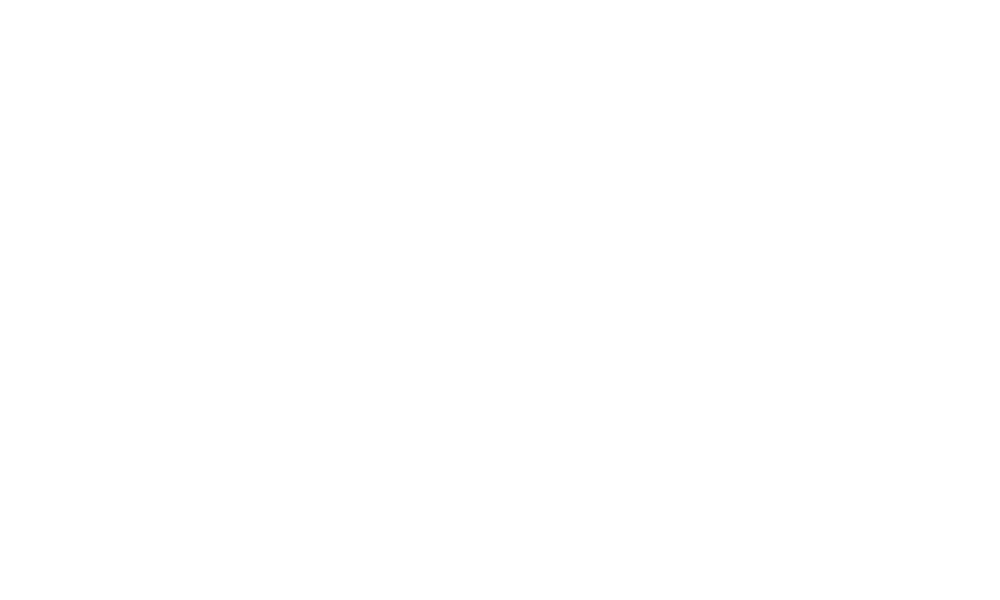


Saving results...
📁 Saving TSV files to Kilosort directory: H:\Data\raw\8186_recall\sorted\sorter_output
All expected metrics were successfully saved.


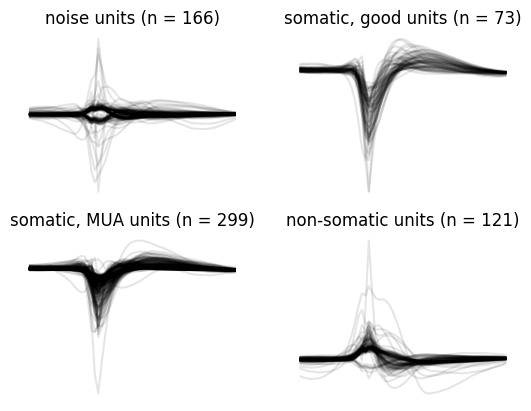

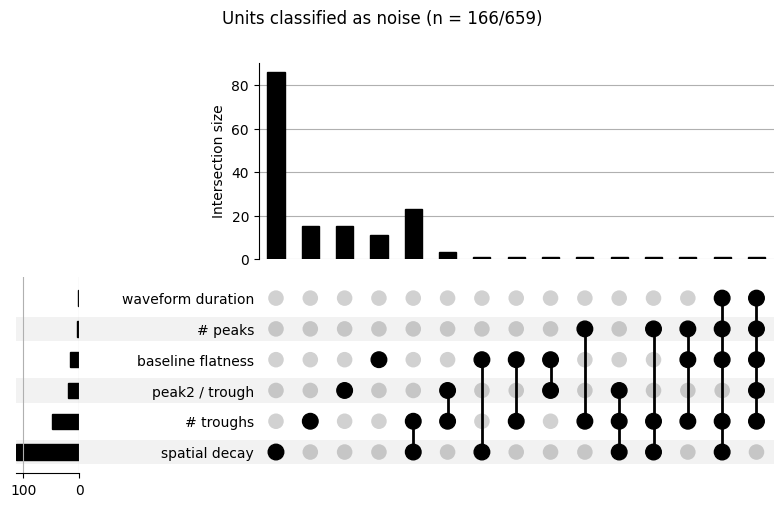

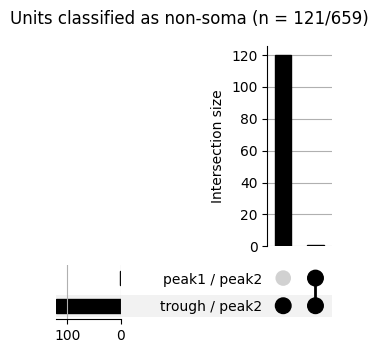

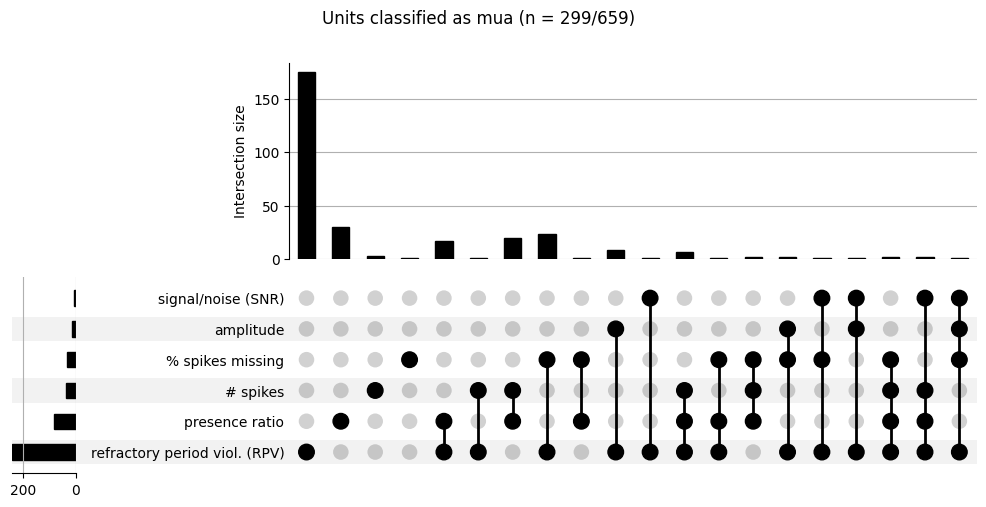

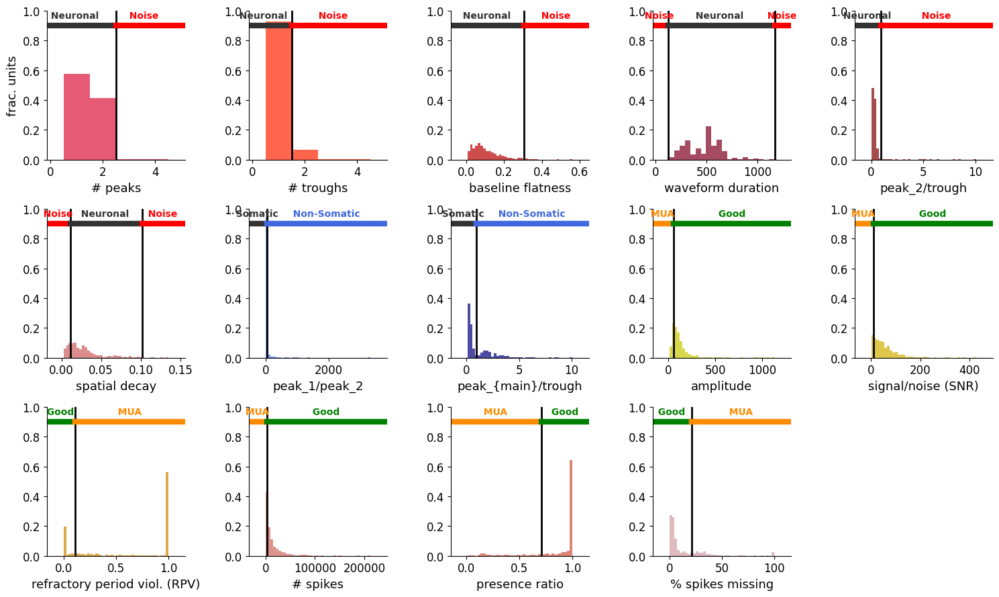

In [13]:
results = bc.run_bombcell(
    ks_dir, save_path, param,
    return_figures=True  # <--- KEY!!!
)
...
figures = results[-1]  # The last value returned, if you use tuple unpacking
# or: (quality_metrics, param, unit_type, unit_type_string, figures) = ...

for fig in figures.values():
    if isinstance(fig, list):  # upset_plots may be a list of figures
        for f in fig:
            display(f)
    elif fig is not None:
        display(fig)

🚀 Starting BombCell quality metrics pipeline...
📁 Processing data from: H:\Data\raw\8186_recall\sorted\sorter_output
Results will be saved to: H:\Data\raw\8186_recall\sorted\sorter_output\bombcell

Loading ephys data...
Loaded ephys data: 659 units, 9,634,770 spikes

🔍 Extracting raw waveforms...
Loading file H:\Data\raw\8186_recall\sorted\sorter_output\bombcell\templates._bc_rawWaveforms.npy... Done!
No splits/merges detected

⚙️ Computing quality metrics for 659 units...
   (Progress bar will appear below)


Computing bombcell quality metrics:   0%|          | 0/659 units


Saving GUI visualization data...
GUI visualization data saved to: H:\Data\raw\8186_recall\sorted\sorter_output\bombcell\for_GUI\gui_data.pkl
   Generated spatial decay fits: 655/659 units
   Generated amplitude fits: 652/659 units

🏷️ Classifying units (good/MUA/noise/non-soma)...

Generating summary plots...


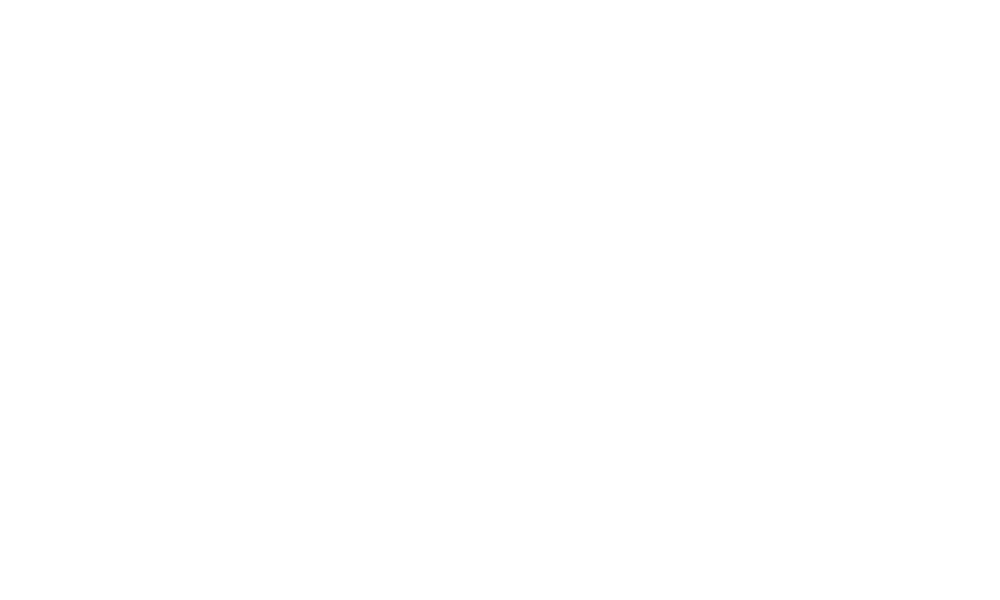


Saving results...
📁 Saving TSV files to Kilosort directory: H:\Data\raw\8186_recall\sorted\sorter_output
All expected metrics were successfully saved.


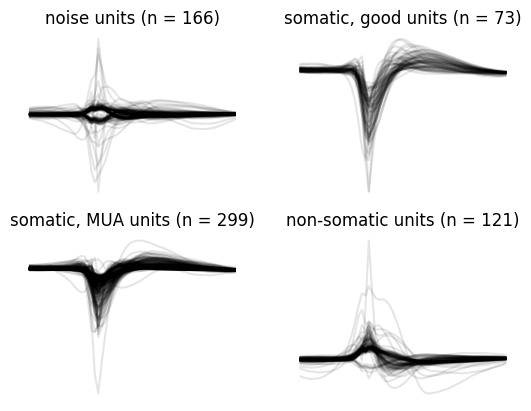

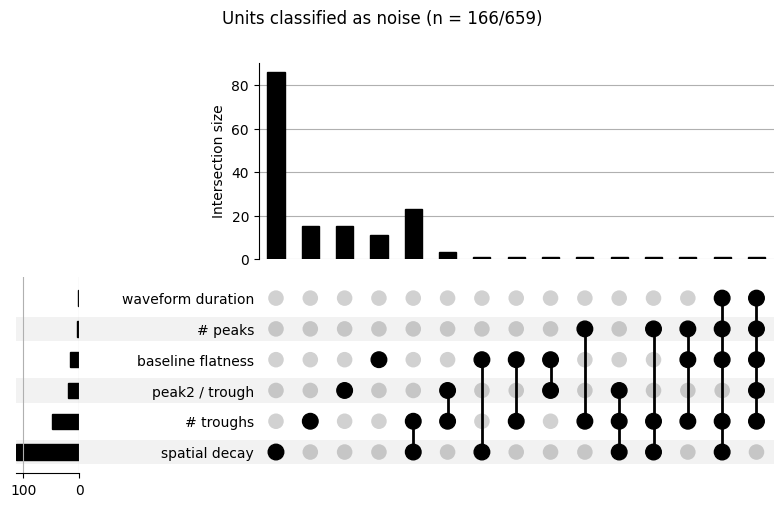

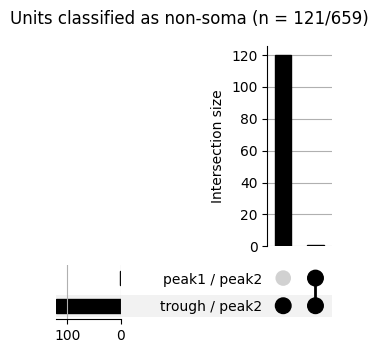

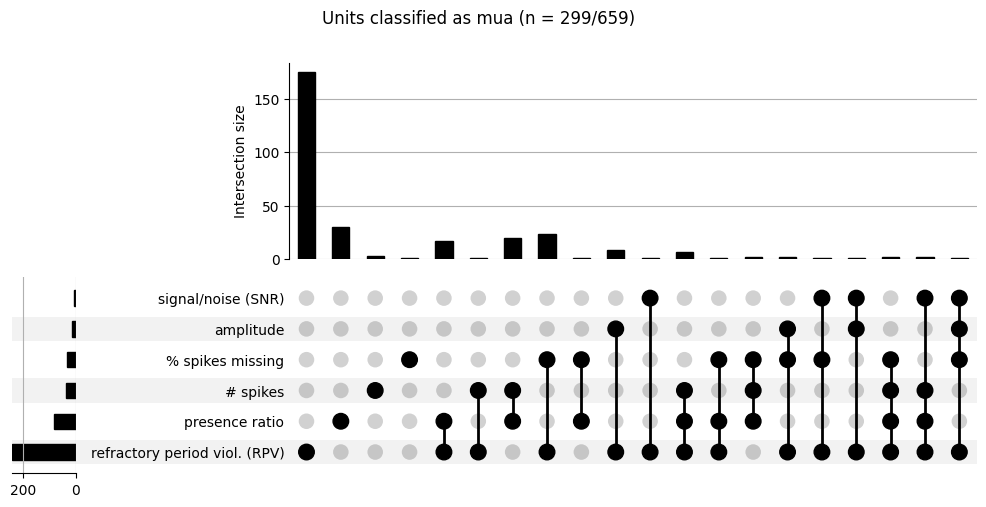

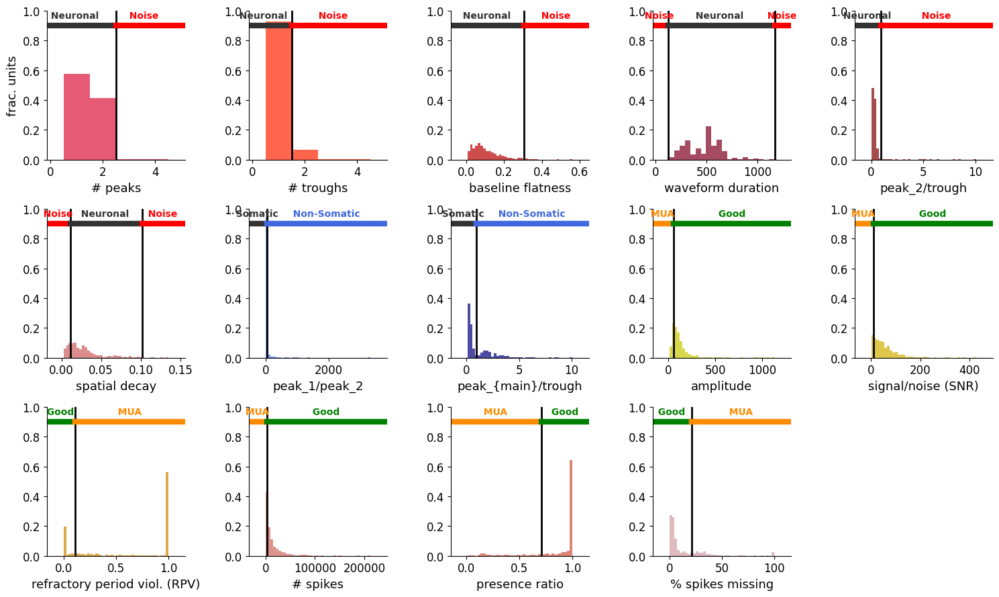

In [14]:

ks_dir = base_path / "sorted" / "sorter_output"
last_part = base_path.name  

imec_dir = base_path / (last_part + "_g0_imec0")
raw_file_path = imec_dir / (last_part + "_g0_t0.imec0.ap.bin")
meta_file_path = imec_dir / (last_part + "_g0_t0.imec0.ap.meta")


# Bombcell output
save_path = ks_dir / "bombcell"



param = bc.get_default_parameters(ks_dir, 
                                  raw_file=raw_file_path,
                                  meta_file=meta_file_path,
                                  kilosort_version=4)
(
    quality_metrics,
    param,
    unit_type,
    unit_type_string,figures,
) = bc.run_bombcell(
    ks_dir, save_path, param, return_figures=True
)

for fig in figures.values():
    if isinstance(fig, list):  # upset_plots may be a list of figures
        for f in fig:
            display(f)
    elif fig is not None:
        display(fig)

# Match Bombcell to GUI

In [12]:



def write_bombcell_curation(base_path: Path) -> None:
    """
    Create SpikeInterface GUI curation_data.json using Bombcell labels.

    Parameters
    ----------
    base_path : Path
        Path to the session folder, e.g.:
        H:/Data/raw/7633_recall
    """

    # ------------------------------------------------------------------
    # Paths (all relative to base_path)
    # ------------------------------------------------------------------
    bc_tsv = (
        base_path
        / "sorted"
        / "sorter_output"
        / "cluster_bc_unitType.tsv"
    )

    si_npy = (
        base_path
        / "analyzed"
        / "sorting"
        / "properties"
        / "original_cluster_id.npy"
    )

    out_path = (
        base_path
        / "analyzed"
        / "spikeinterface_gui"
        / "curation_data.json"
    )
    out_path.parent.mkdir(parents=True, exist_ok=True)

    # ------------------------------------------------------------------
    # Load data
    # ------------------------------------------------------------------
    si_unit_ids = np.load(si_npy)

    map_df = pd.DataFrame(
        {
            "cluster_id": np.arange(len(si_unit_ids), dtype=int),
            "si_unit_id": si_unit_ids,
        }
    )

    bc_df = pd.read_csv(bc_tsv, sep="\t", usecols=["cluster_id", "bc_unitType"])

    # ------------------------------------------------------------------
    # Merge and clean
    # ------------------------------------------------------------------
    merged = (
        map_df
        .merge(bc_df, on="cluster_id", how="left")
        .dropna(subset=["si_unit_id", "bc_unitType"])
    )

    merged["si_unit_id"] = merged["si_unit_id"].astype(int)
    merged["bc_unitType"] = merged["bc_unitType"].astype(str)

    # ------------------------------------------------------------------
    # Manual labels (ensure pure Python types)
    # ------------------------------------------------------------------
    manual_labels = [
        {
            "unit_id": int(uid),
            "bombcell": [str(label)],
        }
        for uid, label in zip(
            merged["si_unit_id"].tolist(),
            merged["bc_unitType"].tolist(),
        )
    ]

    label_options = sorted(str(x) for x in merged["bc_unitType"].unique())

    unit_ids = sorted(
        int(x)
        for x in np.unique(si_unit_ids)
        if not np.isnan(x)
    )

    # ------------------------------------------------------------------
    # Curation dict (JSON-safe)
    # ------------------------------------------------------------------
    curation = {
        "format_version": "2",
        "unit_ids": unit_ids,
        "merges": [],
        "splits": [],
        "removed": [],
        "manual_labels": manual_labels,
        "label_definitions": {
            "bombcell": {
                "exclusive": True,
                "label_options": label_options,
            }
        },
    }

    # ------------------------------------------------------------------
    # Write output
    # ------------------------------------------------------------------
    with out_path.open("w", encoding="utf8") as f:
        json.dump(curation, f, indent=2)

    print(f"Wrote v1-style curation to {out_path}")
write_bombcell_curation(base_path)

Wrote v1-style curation to H:\Data\raw\8186_recall\analyzed\spikeinterface_gui\curation_data.json


In [24]:
from spikeinterface_gui import run_launcher
analyzer_folder = base_path / 'analyzer'
run_launcher(root_folder=analyzer_folder, mode="desktop")

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

RuntimeError: Internal C++ object (ScatterPlotItem) already deleted.

# Analog signals: Speed, camera

In [22]:
1

1

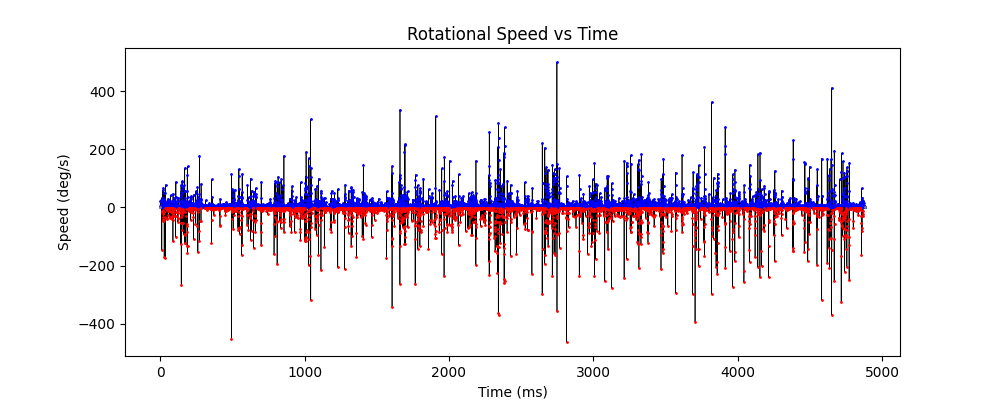

In [16]:

# --- Setup ---
channel_idx = 1  # Adjust as needed
channel_id = event.get_channel_ids()[channel_idx]
sf = event.get_sampling_frequency()

# --- Load entire trace ---
trace = event.get_traces(channel_ids=[channel_id])
signal = trace[:, 0]
time_vector = np.arange(len(signal)) / sf

# --- TTL edge detection ---
import numpy as np
from scipy.signal import medfilt

def ttl_from_analog(signal, fs, hysteresis=0.1, filt_kernel=5):
    """
    Convert analog TTL to digital and extract rising/falling edges.

    Returns
    -------
    digital : (N,) int {0,1}
    rising_idx : np.ndarray
    falling_idx : np.ndarray
    """
    # denoise
    signal_f = medfilt(signal, kernel_size=filt_kernel)

    # adaptive thresholds
    v_low = np.percentile(signal_f, 5)
    v_high = np.percentile(signal_f, 95)

    v_lo = v_low + hysteresis * (v_high - v_low)
    v_hi = v_high - hysteresis * (v_high - v_low)

    digital = np.zeros_like(signal_f, dtype=np.int8)
    state = 0
    for i, v in enumerate(signal_f):
        if state == 0 and v > v_hi:
            state = 1
        elif state == 1 and v < v_lo:
            state = 0
        digital[i] = state

    # edges
    d = np.diff(digital)
    rising_idx = np.where(d == 1)[0] + 1
    falling_idx = np.where(d == -1)[0] + 1

    return digital, rising_idx, falling_idx

from scipy.interpolate import interp1d

def quadrature_speed_direction(sigA, sigB, fs, pulses_per_rev=360, hysteresis=0.1):
    sig_len = len(sigA)
    time_full = np.arange(sig_len) / fs

    digA, rising_A, _ = ttl_from_analog(sigA, fs, hysteresis)
    digB, _, _ = ttl_from_analog(sigB, fs, hysteresis)

    if len(rising_A) < 2:
        return time_full * 1000, np.zeros(sig_len), np.zeros(sig_len)

    t_edges = rising_A / fs

    # direction from B state at A rising
    direction_edges = np.where(digB[rising_A] == 0, 1, -1)

    deg_per_edge = 360.0 / pulses_per_rev
    dtheta = direction_edges * deg_per_edge

    dt = np.diff(t_edges)
    speed_edges = np.diff(np.cumsum(dtheta)) / dt
    dir_edges = direction_edges[1:]

    t_mid = (t_edges[1:] + t_edges[:-1]) / 2

    f_speed = interp1d(t_mid, speed_edges, kind='previous',
                       bounds_error=False, fill_value=0)
    f_dir = interp1d(t_mid, dir_edges, kind='previous',
                     bounds_error=False, fill_value=0)

    return time_full * 1000, f_speed(time_full), f_dir(time_full)


sigA = event.get_traces(channel_ids=[event.get_channel_ids()[6]]).squeeze()
sigB = event.get_traces(channel_ids=[event.get_channel_ids()[5]]).squeeze()
ts_ms, speed, direction = quadrature_speed_direction(sigA, sigB, sf, pulses_per_rev=225)

df = pd.DataFrame({
    'sample': ts_ms,
    'speed': speed,
    'direction': direction
})

downsample_factor = 6000
ts_plot = ts_ms[::downsample_factor] / 1000
speed_plot = speed[::downsample_factor]
dir_plot = direction[::downsample_factor]

plt.figure(figsize=(10, 4))
colors = np.where(dir_plot == 1, 'blue',
                  np.where(dir_plot == -1, 'red', 'gray'))
plt.plot(ts_plot, speed_plot, color='black', linewidth=0.5)
for d_color in [1, -1, 0]:
    mask = dir_plot == d_color
    plt.plot(
        ts_plot[mask],
        speed_plot[mask],
        '.',
        color={1: 'blue', -1: 'red', 0: 'gray'}[d_color],
        markersize=2
    )

plt.xlabel("Time (ms)")
plt.ylabel("Speed (deg/s)")
plt.title("Rotational Speed vs Time")
plt.show()

df.to_csv(metapath / 'speed.csv', index=False)



  ####camdelay

signal = event.get_traces(channel_ids=[event.get_channel_ids()[3]]).squeeze()

digA, _, falling_A = ttl_from_analog(signal, sf, hysteresis=0.1)

t_first = falling_A[0] / sf
df2 = pd.DataFrame({'camttl':[t_first]})
df2.to_csv(metapath / 'camttl.csv', index=False)



In [ ]:
# digital state chnages, Audio

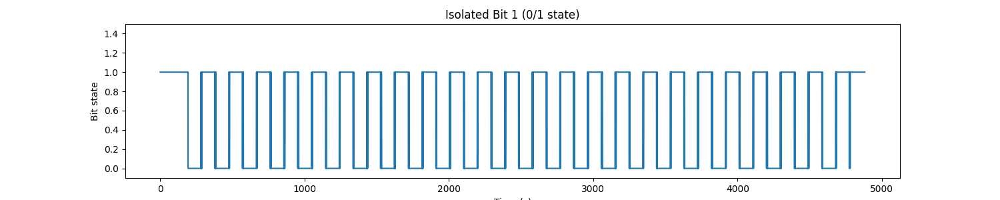

Extracted TTL events for bit 1 saved to H:\Data\raw\8186_recall\Meta/State_changes.csv


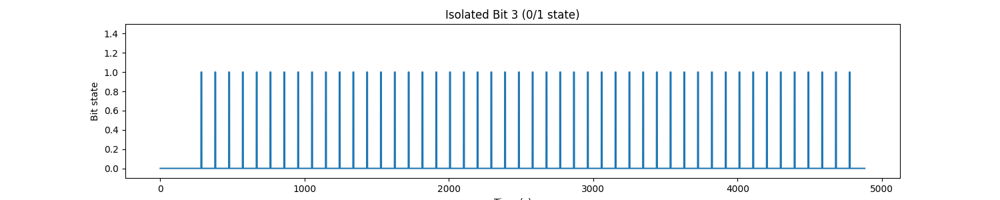

Extracted TTL events for bit 3 saved to H:\Data\raw\8186_recall\Meta/Audio.csv
done


In [18]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def extract_and_save_ttl_events(data, bit_name_pairs, save_path):
    """
    Extract TTL rising/falling events for multiple bits and save to CSV.
    """
    digital_signals = data.get_traces()
    digital_word = digital_signals[:, 8]
    sampling_rate = data.get_sampling_frequency()

    for bit, savename in bit_name_pairs:
        ttl_df = extract_ttl_from_bit(digital_word, bit, sampling_rate)
        filename = f"{savename}.csv"
        full_path = f"{save_path}/{filename}"

        ttl_df.to_csv(full_path, index=False)
        print(f"Extracted TTL events for bit {bit} saved to {full_path}")


def extract_ttl_from_bit(digital_word, bit, sampling_rate, plot=True):
    """
    Extract rising and falling TTL edges for a given bit.
    Returns a DataFrame with timestamps and edge_type columns.
    """
    ttl_signal = (digital_word >> bit) & 1
    time_axis = np.arange(len(ttl_signal)) / sampling_rate

    # optional plot
    if plot:
        plt.figure(figsize=(15, 3))
        plt.plot(time_axis, ttl_signal)
        plt.title(f'Isolated Bit {bit} (0/1 state)')
        plt.xlabel('Time (s)')
        plt.ylabel('Bit state')
        plt.ylim(-0.1, 1.5)
        plt.show()

    # detect edges
    diff = np.diff(ttl_signal)
    rising_indices = np.where(diff > 0)[0]
    falling_indices = np.where(diff < 0)[0]

    rising_timestamps = rising_indices / sampling_rate
    falling_timestamps = falling_indices / sampling_rate

    # combine into dataframe
    edges = np.concatenate([rising_timestamps, falling_timestamps])
    types = (['rising'] * len(rising_timestamps)) + (['falling'] * len(falling_timestamps))

    df = pd.DataFrame({'timestamps': edges, 'edge_type': types}).sort_values('timestamps').reset_index(drop=True)

    return df



pairs = [(1, 'State_changes'), (3, 'Audio')]
extract_and_save_ttl_events(event, pairs, metapath)


print("done")


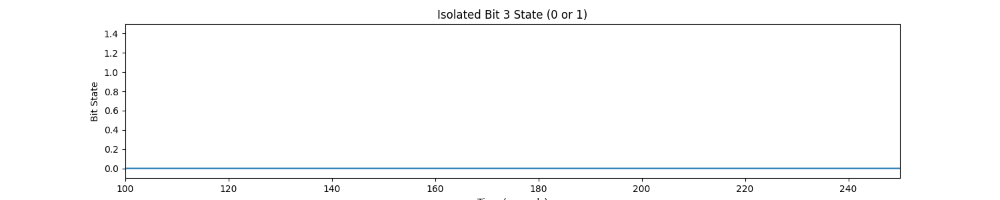

In [19]:
def extract_ttl_from_bit(digital_word, bit, sampling_rate, min_gap_s=5.0):
    """
    Extract and plot TTL bursts, return first rising edge per train.
    """
    ttl_signal = (digital_word >> bit) & 1  # isolate bit
    time_axis = np.arange(len(ttl_signal)) / sampling_rate

    # Plot full or cropped TTL signal
    plt.figure(figsize=(15, 3))
    plt.plot(time_axis, ttl_signal)
    plt.title(f'Isolated Bit {bit} State (0 or 1)')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Bit State')
    plt.ylim(-0.1, 1.5)
    plt.xlim(100, 250) # plot first 10 seconds by default
    plt.show()

    # Rising edges (0 → 1)
    rising_indices = np.where(np.diff(ttl_signal) > 0)[0]
    rising_timestamps = rising_indices / sampling_rate

    # Detect first rising edge of each train
    if len(rising_timestamps) == 0:
        return np.array([])

    first_in_trains = [rising_timestamps[0]]
    for i in range(1, len(rising_timestamps)):
        if rising_timestamps[i] - rising_timestamps[i - 1] > min_gap_s:
            first_in_trains.append(rising_timestamps[i])

    return np.array(first_in_trains)

digital_signals = event.get_traces()
digital_word = digital_signals[:, 8]
sampling_rate = event.get_sampling_frequency()
ttl_timestamps = extract_ttl_from_bit(digital_word, 3, sampling_rate)
        
   

# phy

In [25]:
param_path = f"{basefolder}\\sorted\\phy\\params.py"
!phy template-gui "{param_path}"

15:25:57.160 [W] model:668            Skipping spike waveforms that do not exist, they will be extracted on the fly from the raw data as needed.


# transfer to meta

In [ ]:


bc_label = (
        base_path
        / "sorted"
        / "sorter_output"
        / "cluster_bc_unitType.tsv"
    )

bc_pratio = (
        base_path
        / "sorted"
        / "sorter_output"
        / "cluster_presenceRatio.tsv"
    )


files = [bc_label,bc_pratio]

from functools import reduce


dfs = []
for f in files:
    df = pd.read_csv(f, sep="\t")
    dfs.append(df)

out = reduce(
    lambda left, right: pd.merge(left, right, on="cluster_id", how="outer"),
    dfs
)

out.to_csv(metapath / "cluster_info.csv", index=False)


In [6]:
src = base_path / "sorted" / "phy" / "cluster_info.tsv"
dst = metapath / "cluster_info.tsv"
shutil.copy2(src, dst)


WindowsPath('D:/Data/raw/7644_recall/Meta/cluster_info.tsv')

# optional

In [ ]:

# --- Setup ---
channel_idx = 4  # Adjust as needed
channel_id = event.get_channel_ids()[channel_idx]
sf = event.get_sampling_frequency()

# --- Load entire trace ---
trace = event.get_traces(channel_ids=[channel_id])
signal = trace[:, 0]
time_vector = np.arange(len(signal)) / sf

# --- TTL edge detection ---
def extract_ttl_edges(signal, time_vector, threshold=2000):
    above_threshold = signal > threshold
    changes = np.diff(above_threshold.astype(int))
    
    rising_indices = np.where(changes == 1)[0] + 1
    falling_indices = np.where(changes == -1)[0] + 1

    edge_indices = np.concatenate((rising_indices, falling_indices))
    edge_types = np.array(['rising'] * len(rising_indices) + ['falling'] * len(falling_indices))

    sort_order = np.argsort(edge_indices)
    edge_indices = edge_indices[sort_order]
    edge_types = edge_types[sort_order]

    edge_times = time_vector[edge_indices]

    return edge_times, edge_types, edge_indices

edge_times, edge_types, edge_indices = extract_ttl_edges(signal, time_vector, threshold=10000)

print(len(edge_times))



In [ ]:
# --- Plot with markers ---
plt.figure(figsize=(12, 4))
plt.plot(time_vector, signal, label='Analog signal')
plt.plot(edge_times, signal[edge_indices], 'ro', label='TTL edges')
plt.title(f"TTL signal with edges - channel {channel_id}")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.ylim(0, max(signal) * 1.1)
plt.xlim(100,101)
plt.show()

# --- Save to CSV ---
df_edges = pd.DataFrame({
    'time_seconds': edge_times,
    'edge_type': edge_types
})

event


In [ ]:
import numpy as np
from scipy.signal import medfilt

def extract_ttl_edges_auto(signal, fs, hysteresis=0.1):
    """
    Detect TTL edges from an analog TTL-like signal without a fixed threshold.
    
    Parameters
    ----------
    signal : 1D np.array
        Analog TTL signal.
    fs : float
        Sampling frequency in Hz.
    hysteresis : float
        Fraction of amplitude range for hysteresis thresholding.
    
    Returns
    -------
    edge_times : np.array
        Times of detected edges in seconds.
    edge_types : np.array
        Array of 'rising' or 'falling' corresponding to each edge.
    edge_indices : np.array
        Sample indices of detected edges.
    """
    # --- 1. Denoise a bit ---
    signal_f = medfilt(signal, kernel_size=5)

    # --- 2. Estimate logic levels automatically ---
    hist, bins = np.histogram(signal_f, bins=200)
    peaks = bins[np.argsort(hist)[-2:]]  # two most common levels
    v_low, v_high = np.sort(peaks)
    
    # --- 3. Compute thresholds with hysteresis ---
    v_mid_low  = v_low  + hysteresis * (v_high - v_low)
    v_mid_high = v_high - hysteresis * (v_high - v_low)

    # --- 4. Convert to digital with hysteresis ---
    digital = np.zeros_like(signal_f, dtype=int)
    state = 0
    for i, v in enumerate(signal_f):
        if state == 0 and v > v_mid_high:
            state = 1
        elif state == 1 and v < v_mid_low:
            state = 0
        digital[i] = state

    # --- 5. Detect edges ---
    changes = np.diff(digital)
    rising_indices  = np.where(changes == 1)[0] + 1
    falling_indices = np.where(changes == -1)[0] + 1

    edge_indices = np.concatenate((rising_indices, falling_indices))
    edge_types = np.array(['rising'] * len(rising_indices) + ['falling'] * len(falling_indices))

    sort_order = np.argsort(edge_indices)
    edge_indices = edge_indices[sort_order]
    edge_types = edge_types[sort_order]
    
    edge_times = edge_indices / fs

    return edge_times, edge_types, edge_indices

channel_idx = 1  # Adjust as needed
channel_id = event.get_channel_ids()[channel_idx]

sigA = event.get_traces(channel_ids=[channel_id]).squeeze()
sf = event.get_sampling_frequency()


edge_times, edge_types, edge_indices = extract_ttl_edges_auto(sigA, sf)
print(edge_times[:10], edge_types[:10])


In [ ]:
import numpy as np
from scipy.signal import medfilt

def extract_ttl_edges_auto(signal, fs, hysteresis=0.1):
    """Detect TTL edges robustly from analog signal."""
    signal_f = medfilt(signal, kernel_size=5)
    hist, bins = np.histogram(signal_f, bins=200)
    peaks = bins[np.argsort(hist)[-2:]]  # two most common levels
    v_low, v_high = np.sort(peaks)
    v_mid_low = v_low + hysteresis * (v_high - v_low)
    v_mid_high = v_high - hysteresis * (v_high - v_low)

    digital = np.zeros_like(signal_f, dtype=int)
    state = 0
    for i, v in enumerate(signal_f):
        if state == 0 and v > v_mid_high:
            state = 1
        elif state == 1 and v < v_mid_low:
            state = 0
        digital[i] = state

    changes = np.diff(digital)
    rising_indices = np.where(changes == 1)[0] + 1
    falling_indices = np.where(changes == -1)[0] + 1

    edge_indices = np.concatenate((rising_indices, falling_indices))
    edge_types = np.array(['rising'] * len(rising_indices) + ['falling'] * len(falling_indices))
    sort_order = np.argsort(edge_indices)
    edge_indices = edge_indices[sort_order]
    edge_types = edge_types[sort_order]
    edge_times = edge_indices / fs
    return edge_times, edge_types, edge_indices, digital

def quadrature_speed_direction(sigA, sigB, fs, pulses_per_rev=360, hysteresis=0.1):
    """
    Compute rotational speed (deg/s) and direction from analog quadrature encoder.
    """
    # --- Extract TTL edges ---
    _, _, _, digA = extract_ttl_edges_auto(sigA, fs, hysteresis)
    _, _, _, digB = extract_ttl_edges_auto(sigB, fs, hysteresis)

    # Detect rising edges on channel A
    rising_A = np.where((digA[1:] > digA[:-1]) & (digA[:-1] == 0))[0] + 1
    t_edges = rising_A / fs

    # Determine direction at each rising edge using channel B
    direction = np.where(digB[rising_A] == 0, 1, -1)  # 1=CW, -1=CCW

    # Incremental rotation per pulse
    deg_per_edge = 360.0 / pulses_per_rev
    dtheta = direction * deg_per_edge

    # Instantaneous speed
    dt = np.diff(t_edges)
    speed = np.diff(np.cumsum(dtheta)) / dt
    mid_time = (t_edges[1:] + t_edges[:-1]) / 2

    return mid_time, speed, direction[1:]

# --- Example usage with SpikeInterface / NIDAQ ---
fs = event.get_sampling_frequency()
sigA = event.get_traces(channel_ids=[event.get_channel_ids()[1]]).squeeze()
sigB = event.get_traces(channel_ids=[event.get_channel_ids()[2]]).squeeze()

ts, speed, dirn = quadrature_speed_direction(sigA, sigB, fs, pulses_per_rev=360)
print(f"Mean speed: {np.mean(np.abs(speed)):.1f} deg/s, direction: {'CW' if np.mean(dirn)>0 else 'CCW'}")
len(sigA)


from scipy.interpolate import interp1d

fs = event.get_sampling_frequency()
sig_len = len(sigA)
time_full = np.arange(sig_len) / fs

# interpolate speed and direction to full sample times
f_speed = interp1d(ts, speed, kind='previous', fill_value="extrapolate")
speed_full = f_speed(time_full)

f_dir = interp1d(ts, dirn, kind='previous', fill_value="extrapolate")
dir_full = f_dir(time_full)

In [ ]:
import numpy as np
from scipy.signal import medfilt
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt

def extract_ttl_edges_auto(signal, fs, hysteresis=0.1):
    """Detect TTL edges robustly from analog signal."""
    signal_f = medfilt(signal, kernel_size=5)
    hist, bins = np.histogram(signal_f, bins=200)
    peaks = bins[np.argsort(hist)[-2:]]  # two most common levels
    v_low, v_high = np.sort(peaks)
    v_mid_low = v_low + hysteresis * (v_high - v_low)
    v_mid_high = v_high - hysteresis * (v_high - v_low)

    digital = np.zeros_like(signal_f, dtype=int)
    state = 0
    for i, v in enumerate(signal_f):
        if state == 0 and v > v_mid_high:
            state = 1
        elif state == 1 and v < v_mid_low:
            state = 0
        digital[i] = state

    return digital

def quadrature_speed_direction(sigA, sigB, fs, pulses_per_rev=360, hysteresis=0.1):
    """Compute speed (deg/s) and direction (1=CW, -1=CCW, 0=no movement)."""
    sig_len = len(sigA)
    time_full = np.arange(sig_len) / fs  # seconds

    # convert to digital
    digA = extract_ttl_edges_auto(sigA, fs, hysteresis)
    digB = extract_ttl_edges_auto(sigB, fs, hysteresis)

    # detect rising edges on channel A
    rising_A = np.where((digA[1:] > digA[:-1]) & (digA[:-1] == 0))[0] + 1
    t_edges = rising_A / fs

    # compute incremental rotation
    direction_edges = np.where(digB[rising_A] == 0, 1, -1)
    deg_per_edge = 360.0 / pulses_per_rev
    dtheta = direction_edges * deg_per_edge

    # instantaneous speed between pulses
    dt = np.diff(t_edges)
    speed_edges = np.diff(np.cumsum(dtheta)) / dt
    dir_edges = direction_edges[1:]

    # interpolate speed and direction to full sample times
    if len(t_edges) > 1:
        f_speed = interp1d((t_edges[1:] + t_edges[:-1])/2, speed_edges,
                           kind='previous', bounds_error=False, fill_value=0)
        f_dir = interp1d((t_edges[1:] + t_edges[:-1])/2, dir_edges,
                         kind='previous', bounds_error=False, fill_value=0)
        speed_full = f_speed(time_full)
        dir_full = f_dir(time_full)
    else:
        speed_full = np.zeros(sig_len)
        dir_full = np.zeros(sig_len)

    return time_full*1000, speed_full, dir_full  # time in ms




fs = event.get_sampling_frequency()
sigA = event.get_traces(channel_ids=[event.get_channel_ids()[6]]).squeeze()
sigB = event.get_traces(channel_ids=[event.get_channel_ids()[5]]).squeeze()
ts_ms, speed, direction = quadrature_speed_direction(sigA, sigB, fs, pulses_per_rev=225)

downsample_factor = 1  # plot every Xth sample
ts_plot = ts_ms[::downsample_factor]/1000
speed_plot = speed[::downsample_factor]
dir_plot = direction[::downsample_factor]

plt.figure(figsize=(10,4))
colors = np.where(dir_plot==1, 'blue', np.where(dir_plot==-1, 'red', 'gray'))
plt.plot(ts_plot, speed_plot, color='black', linewidth=0.5)  # line for speed
for d_color in [1, -1, 0]:
    mask = dir_plot == d_color
    plt.plot(ts_plot[mask], speed_plot[mask], '.', color={1:'blue', -1:'red', 0:'gray'}[d_color], markersize=2)

plt.xlabel("Time (ms)")
plt.ylabel("Speed (deg/s)")
plt.title("Rotational Speed vs Time")
#plt.ylim(37,50)
#plt.xlim(2300,2400)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# assume ts_plot, speed_plot, dir_plot are numpy arrays
df = pd.DataFrame({'t': ts_plot, 'speed': speed_plot, 'dir': dir_plot})

# rolling smoothing (change window size for more/less smoothing)
df['smooth'] = df['speed'].rolling(window=1000, center=True, min_periods=1).mean()

plt.figure(figsize=(10,4))
colors = np.where(df['dir']==1, 'blue', np.where(df['dir']==-1, 'red', 'gray'))

# smoothed line
plt.plot(df['t'], df['smooth'], color='black', linewidth=1.5, alpha=0.8)

# individual points by direction
#plt.scatter(df['t'], df['speed'], c=colors, s=4, alpha=0.4)

plt.xlabel("Time (ms)")
plt.ylabel("Speed (deg/s)")
plt.title("Rotational Speed vs Time (Smoothed)")
plt.show()
